# DEMO: Exploratory Data Analysis (EDA) module functionalities

This notebook provides a demo of how to utilise the EDA module.
Things to present:
- categorical data
- [x] countplot
    - [x] count user barplot
    - [x] count group boxplot
    - [x] value group boxplot
- [x] lineplot
- [x] missingness
- [x] punchcard

In [1]:
import os
import sys
sys.path.append('../')


import numpy as np
import pandas as pd
import niimpy

from niimpy.preprocessing.survey import *
from niimpy.exploration import EDA_categorical, EDA_countplot, EDA_lineplot, EDA_missingness, EDA_punchcard


## 1) Categorical plot

## Load data
We will load a mock survey data file.

In [2]:
# go to paretn directory
os.chdir('..')
# Get the current working directory
cwd = os.getcwd()

# Print the current working directory
print("Current working directory: {0}".format(cwd))

data_folder = os.path.join(cwd,"niimpy","sampledata","mock-survey.csv")
print(data_folder)

from pathlib import Path

data_folder = Path(data_folder)
print(data_folder)



Current working directory: D:\niimpy
D:\niimpy\niimpy\sampledata\mock-survey.csv
D:\niimpy\niimpy\sampledata\mock-survey.csv


In [3]:
# Load a mock dataframe
df = niimpy.read_csv(data_folder,tz='Europe/Helsinki')
df.head()

,user,age,gender,Little interest or pleasure in doing things.,Feeling down; depressed or hopeless.,Feeling nervous; anxious or on edge.,Not being able to stop or control worrying.,In the last month; how often have you felt that you were unable to control the important things in your life?,In the last month; how often have you felt confident about your ability to handle your personal problems?,In the last month; how often have you felt that things were going your way?,In the last month; how often have you been able to control irritations in your life?,In the last month; how often have you felt that you were on top of things?,In the last month; how often have you been angered because of things that were outside of your control?,In the last month; how often have you felt difficulties were piling up so high that you could not overcome them?
0,1,20,Male,several-days,more-than-half-the-days,not-at-all,nearly-every-day,almost-never,sometimes,fairly-often,never,sometimes,very-often,fairly-often
1,2,32,Male,more-than-half-the-days,more-than-half-the-days,not-at-all,several-days,never,never,very-often,sometimes,never,fairly-often,never
2,3,15,Male,more-than-half-the-days,not-at-all,several-days,not-at-all,never,very-often,very-often,fairly-often,never,never,almost-never
3,4,35,Female,not-at-all,nearly-every-day,not-at-all,several-days,very-often,fairly-often,very-often,never,sometimes,never,fairly-often
4,5,23,Male,more-than-half-the-days,not-at-all,more-than-half-the-days,several-days,almost-never,very-often,almost-never,sometimes,sometimes,very-often,never


In [4]:
df.describe()

,user,age
count,1000.000000,1000.000000
mean,500.500000,26.911000
std,288.819436,4.992595
min,1.000000,12.000000
25%,250.750000,23.000000
50%,500.500000,27.000000
75%,750.250000,30.000000
max,1000.000000,43.000000


## Preprocessing 
The dataframe's columns are raw questions from a survey. Some questions belong to a specific category, so we will annotate them with ids. The id is constructed from a prefix (the questionnaire category: GAD, PHQ, PSQI etc.), followed by the question number (1,2,3). Similarly, we will also the answers to meaningful numerical values.

**Note:** It's important that the dataframe follows the below schema before passing into niimpy.

In [5]:
# Convert column name to id, based on provided mappers from niimpy
col_id = {**PHQ2_MAP, **PSQI_MAP, **PSS10_MAP, **PANAS_MAP, **GAD2_MAP}
selected_cols = [col for col in df.columns if col in col_id.keys()]

# Convert data frame to long format
m_df = pd.melt(df, id_vars=['user', 'age', 'gender'], value_vars=selected_cols, var_name='question', value_name='answer')

# Assign questions to codes 
m_df['id'] = m_df['question'].replace(col_id)
m_df.head()

,user,age,gender,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,several-days,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,not-at-all,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1


We can use a helper method to convert the answers into numerical value. The pre-defined mapper inside survey.py would be useful for this step.

In [6]:
# Transform raw answers to numerical values
m_df['answer'] = niimpy.preprocessing.survey.convert_to_numerical_answer(m_df, answer_col = 'answer',
                                question_id = 'id', id_map=ID_MAP_PREFIX, use_prefix=True)
m_df.head()

,user,age,gender,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,1,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,2,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,2,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,0,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,2,PHQ2_1


We can also produce a summary of the questionaire's score. This function can describe aggregated score over the whole population, or specific subgroups.

In [7]:
d = niimpy.preprocessing.survey.print_statistic(m_df)
pd.DataFrame(d)

,PSS10,PHQ2,GAD2
min,4.000000,0.0000,0.000000
max,27.000000,6.0000,6.000000
avg,14.006000,3.0520,3.042000
std,3.687759,1.5855,1.536423


In [8]:
d = niimpy.preprocessing.survey.print_statistic(m_df, group='gender')
pd.DataFrame(d)

PSS10                 PHQ2                GAD2          
        Female       Male    Female      Male    Female      Male
min   4.000000   4.000000  0.000000  0.000000  0.000000  0.000000
max  27.000000  23.000000  6.000000  6.000000  6.000000  6.000000
avg  14.059063  13.954813  3.067210  3.037328  3.087576  2.998035
std   3.783230   3.596247  1.605337  1.567567  1.585157  1.488141

In [9]:
d = niimpy.preprocessing.survey.print_statistic(m_df, group='gender', prefix='PHQ')
pd.DataFrame(d)

## TODO: Add a method to categorize score into levels
## TODO: Extend to demographics info

PHQ          
       Female      Male
min  0.000000  0.000000
max  6.000000  6.000000
avg  3.067210  3.037328
std  1.605337  1.567567

## Visualization

We can now make some plots for the preprocessed data frame. First, we can display the summary for a specific question.

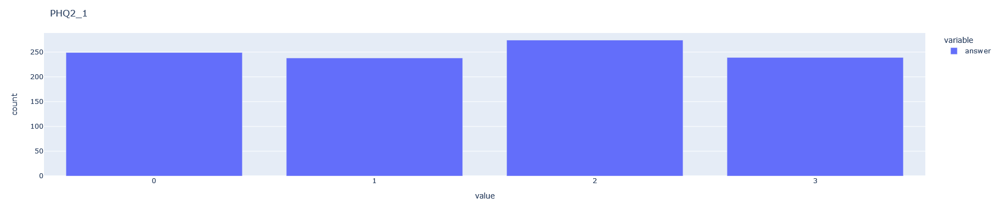

In [10]:
fig = EDA_categorical.questionnaire_summary(m_df, 
                                            question = 'PHQ2_1', 
                                            column = 'answer', 
                                            title='PHQ2_1', 
                                            xlabel='value', 
                                            ylabel='count', 
                                            width=600, 
                                            height=400)
fig.show()

We can also display the summary for each subgroup.

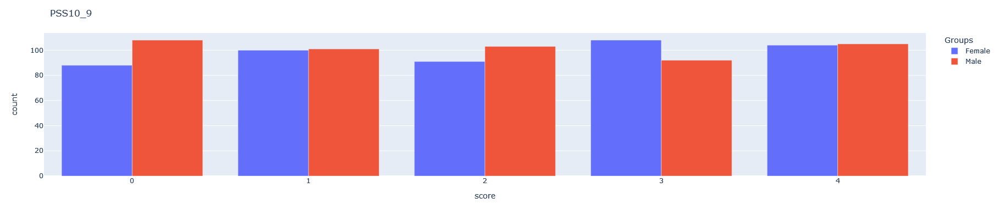

In [11]:
fig = EDA_categorical.questionnaire_grouped_summary(m_df, 
                                                    question='PSS10_9', 
                                                    group='gender', 
                                                    title='PSS10_9',
                                                    xlabel='score',
                                                    ylabel='count',
                                                    width=800,
                                                    height=400)
fig.show()

With some quick preprocessing, we can display the score distribution of each questionaire.

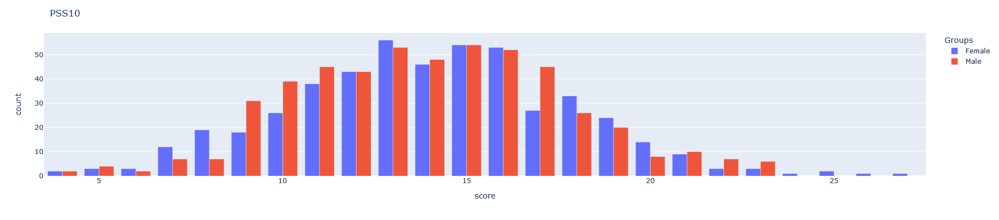

In [12]:
pss_sum_df = m_df[m_df['id'].str.startswith('PSS')] \
                            .groupby(['user', 'gender']) \
                            .agg({'answer':sum}) \
                            .reset_index()
pss_sum_df['id'] = 'PSS'

fig = EDA_categorical.questionnaire_grouped_summary(pss_sum_df, 
                                                    question='PSS', 
                                                    group='gender', 
                                                    title='PSS10',
                                                    xlabel='score', 
                                                    ylabel='count',
                                                    width=800, 
                                                    height=400)
fig.show()

## 2) Countplot

In [13]:
m_df.loc[:10,:]

,user,age,gender,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,1,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,2,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,2,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,0,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,2,PHQ2_1
5,6,31,Female,Little interest or pleasure in doing things.,0,PHQ2_1
6,7,30,Male,Little interest or pleasure in doing things.,0,PHQ2_1
7,8,23,Male,Little interest or pleasure in doing things.,2,PHQ2_1
8,9,32,Male,Little interest or pleasure in doing things.,3,PHQ2_1
9,10,30,Male,Little interest or pleasure in doing things.,3,PHQ2_1


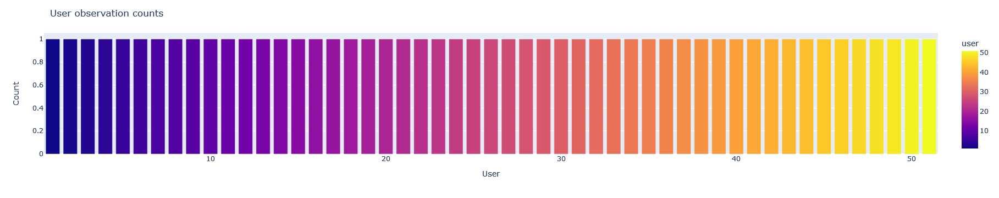

In [14]:
EDA_countplot.EDA_countplot(m_df.loc[:50,:],
                            fig_title = 'User observation counts', 
                            plot_type = 'count', 
                            points = 'all',
                            aggregation = 'user', 
                            user = None, 
                            column='answer')

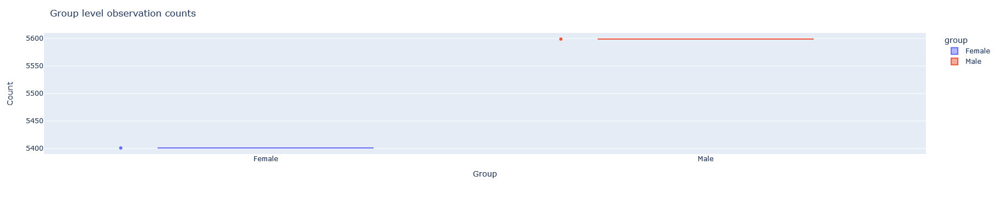

In [15]:
m_df.rename(columns={"gender": "group",},inplace=True)

EDA_countplot.EDA_countplot(m_df,
                            fig_title = 'Group level observation counts', 
                            plot_type = 'count', 
                            points = 'all',
                            aggregation = 'group', 
                            user = None, 
                            )

In [16]:
m_df

,user,age,group,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,1,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,2,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,2,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,0,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,2,PHQ2_1
...,...,...,...,...,...,...
10995,996,26,Female,In the last month; how often have you felt dif...,3,PSS10_9
10996,997,32,Female,In the last month; how often have you felt dif...,4,PSS10_9
10997,998,31,Male,In the last month; how often have you felt dif...,3,PSS10_9
10998,999,26,Male,In the last month; how often have you felt dif...,3,PSS10_9


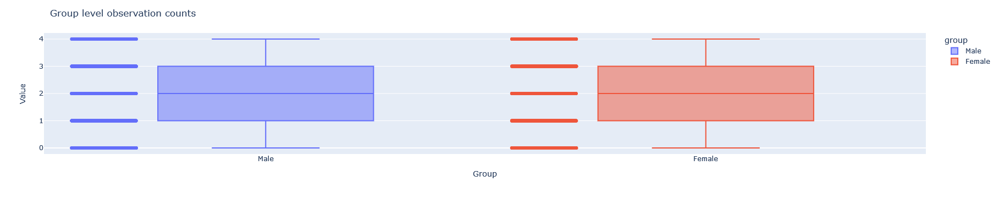

In [17]:
EDA_countplot.EDA_countplot(m_df,
                            fig_title = 'Group level observation counts', 
                            plot_type = 'value', 
                            points = 'all',
                            aggregation = 'group', 
                            user = None,
                            column = 'answer',
                            binning = False
                            )



## 3) Lineplot


## Read activity data

In [18]:
#path = r'C:\Users\Arsi\Documents\GitHub\niimpy\niimpy\sampledata\sl_activity.csv'
path = r'D:\niimpy\niimpy\sampledata\sl_activity.csv'
sf = pd.read_csv(path)

In [19]:
sf.set_index('timestamp',inplace=True)

In [20]:
sf.index = pd.to_datetime(sf.index)

In [21]:
sf.index

DatetimeIndex(['2013-03-27 06:00:00-05:00', '2013-03-27 07:00:00-05:00',
               '2013-03-27 08:00:00-05:00', '2013-03-27 09:00:00-05:00',
               '2013-03-27 10:00:00-05:00', '2013-03-27 11:00:00-05:00',
               '2013-03-27 12:00:00-05:00', '2013-03-27 13:00:00-05:00',
               '2013-03-27 14:00:00-05:00', '2013-03-27 15:00:00-05:00',
               ...
               '2013-05-31 13:00:00-05:00', '2013-05-31 14:00:00-05:00',
               '2013-05-31 15:00:00-05:00', '2013-05-31 16:00:00-05:00',
               '2013-05-31 17:00:00-05:00', '2013-05-31 18:00:00-05:00',
               '2013-05-31 19:00:00-05:00', '2013-05-31 20:00:00-05:00',
               '2013-05-31 21:00:00-05:00', '2013-05-31 22:00:00-05:00'],
              dtype='datetime64[ns, pytz.FixedOffset(-300)]', name='timestamp', length=55907, freq=None)

In [22]:
sf_loc = sf.tz_localize(None)
sf_loc

,user,activity,group
timestamp,,,
2013-03-27 06:00:00,u00,2,none
2013-03-27 07:00:00,u00,1,none
2013-03-27 08:00:00,u00,2,none
2013-03-27 09:00:00,u00,3,none
2013-03-27 10:00:00,u00,4,none
...,...,...,...
2013-05-31 18:00:00,u59,5,mild
2013-05-31 19:00:00,u59,5,mild
2013-05-31 20:00:00,u59,4,mild


In [23]:
sf

,user,activity,group
timestamp,,,
2013-03-27 06:00:00-05:00,u00,2,none
2013-03-27 07:00:00-05:00,u00,1,none
2013-03-27 08:00:00-05:00,u00,2,none
2013-03-27 09:00:00-05:00,u00,3,none
2013-03-27 10:00:00-05:00,u00,4,none
...,...,...,...
2013-05-31 18:00:00-05:00,u59,5,mild
2013-05-31 19:00:00-05:00,u59,5,mild
2013-05-31 20:00:00-05:00,u59,4,mild


<AxesSubplot:xlabel='timestamp'>

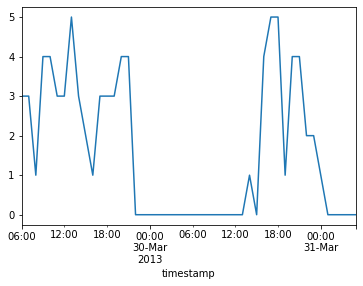

In [24]:
sf[sf['user'] == 'u00']['activity'].resample('H').mean()[48:96].plot()

<AxesSubplot:xlabel='timestamp'>

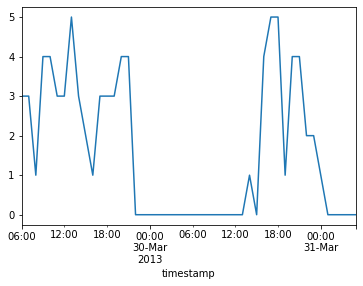

In [25]:
sf_loc[sf_loc['user'] == 'u00']['activity'].resample('H').mean()[48:96].plot()

## 1) one time series

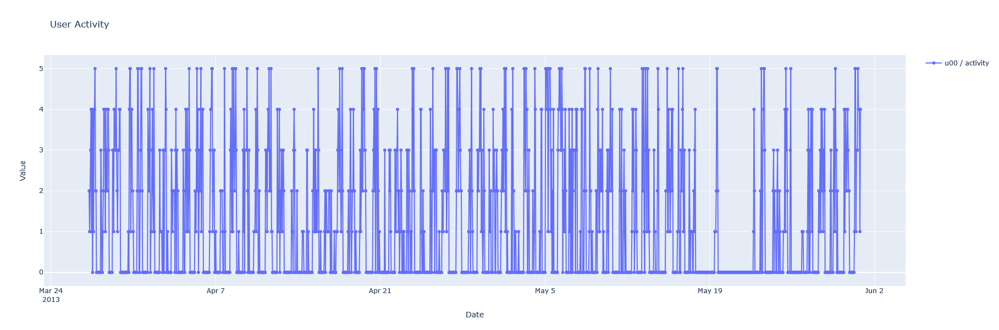

In [26]:
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
users = ['u00']
resample = False
interpolate = False
window_len = 1
resample = 'H'

fig = EDA_lineplot.timeplot(sf_loc,
                            users,
                            columns,
                            title ,
                            xlabel,
                            ylabel,
                            resample,
                            interpolate,
                            window_len,
                            )

fig.show()

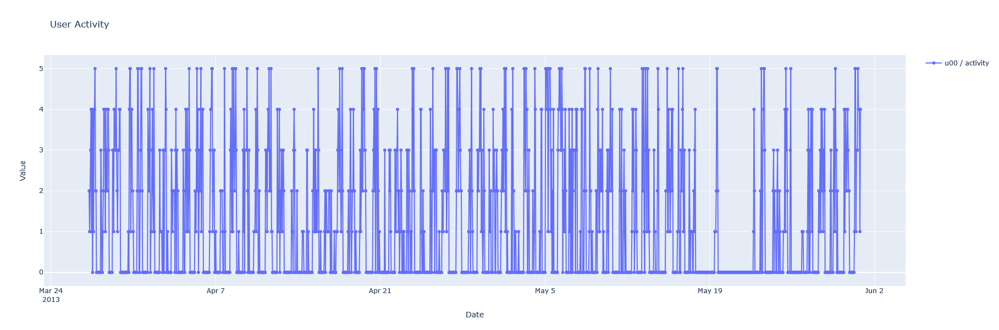

In [27]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users,
                            columns,
                            title ,
                            xlabel,
                            ylabel,
                            resample,
                            interpolate,
                            window_len,
                            )

fig.show()

## 1 b) Reset index

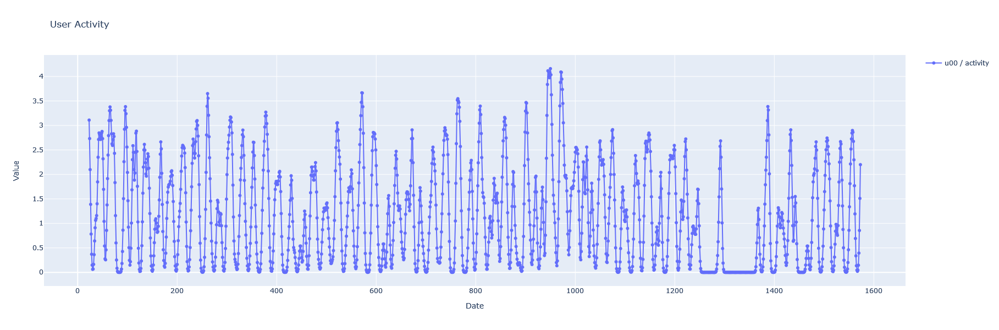

In [28]:
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
users = ['u00']
resample = True
interpolate = True
window_len = 24
resample = 'H'
reset_index = True

fig = EDA_lineplot.timeplot(sf_loc,
         users,
         columns,
         title ,
         xlabel,
         ylabel,
         resample,
         interpolate,
         window_len,
         reset_index
        )

fig.show()

## 1 c) Sampled by day

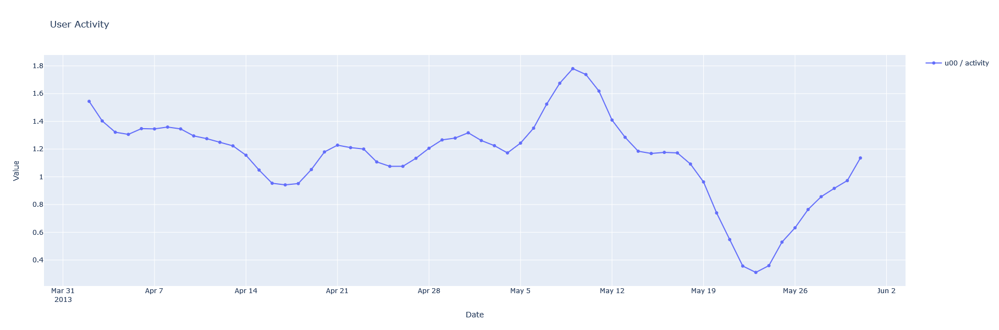

In [29]:
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
users = ['u00']
resample = True
interpolate = True
window_len = 7
resample = 'D'

fig = EDA_lineplot.timeplot(sf_loc,
         users,
         columns,
         title ,
         xlabel,
         ylabel,
         resample,
         interpolate,
         window_len,
        )

fig.show()

## 2) two users

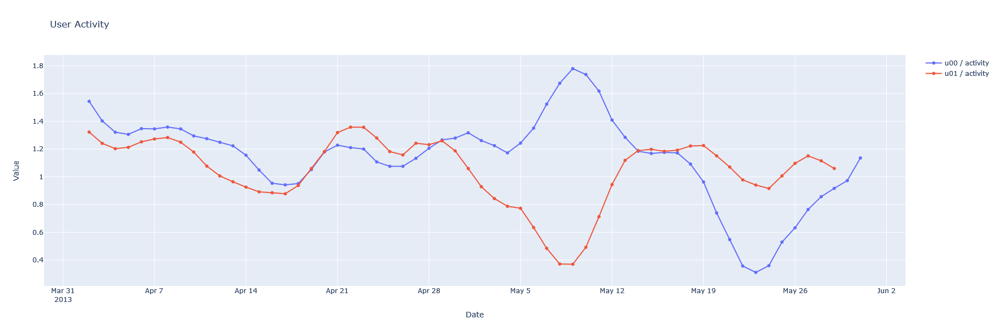

In [30]:
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
users = ['u00','u01']
resample = True
interpolate = True
window_len = 7
resample = 'D'

fig = EDA_lineplot.timeplot(sf_loc,
         users,
         columns,
         title ,
         xlabel,
         ylabel,
         resample,
         interpolate,
         window_len,
        )

fig.show()

## 3) group level hourly averages

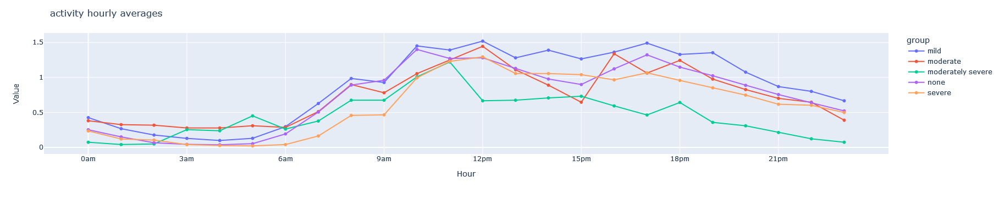

In [31]:
users = 'Group'
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
smooth = True
resample = True
window_len = 7
interpolate = True
resample = 'D'
reset_index = False
by = 'hour'

fig = EDA_lineplot.timeplot(sf_loc,
                            users,
                            columns,
                            title ,
                            xlabel,
                            ylabel,
                            resample,
                            interpolate,
                            window_len,
                            reset_index,
                            by
                            )

fig.show()

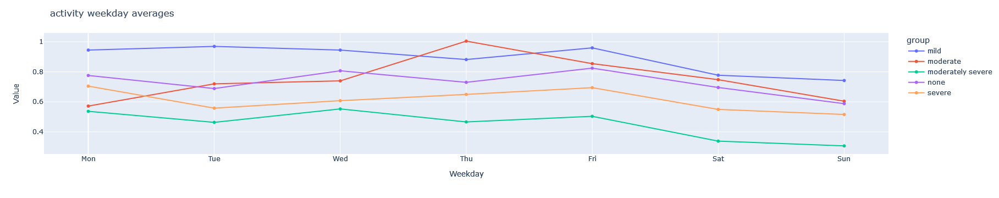

In [32]:
users = 'Group'
columns = ['activity']
title = 'User Activity'
xlabel = 'Date'
ylabel = 'Value'
smooth = True
resample = True
window_len = 7
interpolate = True
resample = 'D'
reset_index = False
by = 'weekday'

fig = EDA_lineplot.timeplot(sf_loc,
                            users,
                            columns,
                            title ,
                            xlabel,
                            ylabel,
                            resample,
                            interpolate,
                            window_len,
                            reset_index,
                            by
                            )

fig.show()

## 4) countplot with sl data


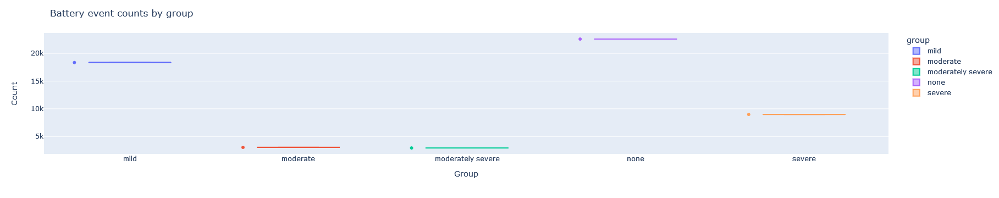

In [33]:
EDA_countplot.EDA_countplot(sf_loc, 
                            fig_title = 'Battery event counts by group', 
                            plot_type = 'count', 
                            points = 'all',
                            aggregation = 'group', 
                            user = None, 
                            column=None,
                            binning=False)

In [34]:
'''
bins = sf.index.to_period('D')
bins = bins.to_series().astype(str)
sf['bins'] = bins.values
'''

"\nbins = sf.index.to_period('D')\nbins = bins.to_series().astype(str)\nsf['bins'] = bins.values\n"

In [35]:
import sys
sys.path.append('/scratch/cs/networks-nima-mmm2018/Arsi/niimpy_fork/niimpy')
import numpy as np
import pandas as pd
import niimpy
import plotly
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.templates.default = "seaborn"
px.defaults.template = "ggplot2"
px.defaults.color_continuous_scale = px.colors.sequential.RdBu
px.defaults.width = 1200
px.defaults.height = 482

In [36]:
'''
fig = px.box(sf,
                     x = "bins", 
                     y = 'activity',
                     color = "group",
                     )

fig.update_traces(quartilemethod='inclusive') # or "inclusive", or "linear" by default
fig.update_layout(title = 'title',
                    xaxis_title = 'xlabel',
                      yaxis_title ='ylabel',
                      autotypenumbers='convert types') 
    
fig.show()
'''

'\nfig = px.box(sf,\n                     x = "bins", \n                     y = \'activity\',\n                     color = "group",\n                     )\n\nfig.update_traces(quartilemethod=\'inclusive\') # or "inclusive", or "linear" by default\nfig.update_layout(title = \'title\',\n                    xaxis_title = \'xlabel\',\n                      yaxis_title =\'ylabel\',\n                      autotypenumbers=\'convert types\') \n    \nfig.show()\n'

In [37]:
sf

,user,activity,group
timestamp,,,
2013-03-27 06:00:00-05:00,u00,2,none
2013-03-27 07:00:00-05:00,u00,1,none
2013-03-27 08:00:00-05:00,u00,2,none
2013-03-27 09:00:00-05:00,u00,3,none
2013-03-27 10:00:00-05:00,u00,4,none
...,...,...,...
2013-05-31 18:00:00-05:00,u59,5,mild
2013-05-31 19:00:00-05:00,u59,5,mild
2013-05-31 20:00:00-05:00,u59,4,mild


C:\Users\arsii\anaconda3\envs\CS\lib\site-packages\pandas\core\arrays\datetimes.py:1143: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



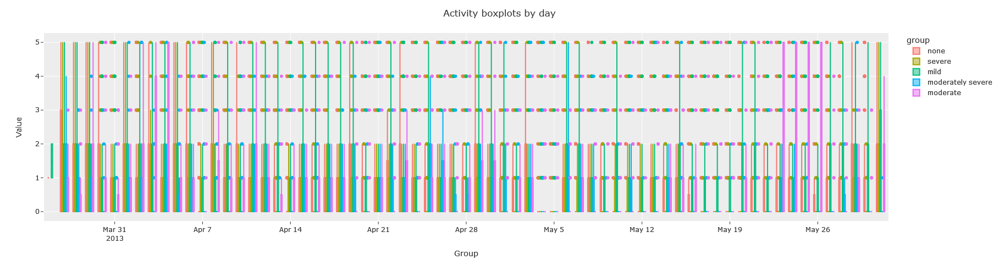

In [38]:
EDA_countplot.EDA_countplot(sf, 
                            fig_title = 'Activity boxplots by day', 
                            plot_type = 'value', 
                            points = 'all',
                            aggregation = 'group', 
                            user = None, 
                            column='activity',
                            binning='D')

## 4) Punchcard

### one subject one sensor


In [39]:
# PLOTLY SETTINGS
pio.templates.default = "seaborn"
px.defaults.template = "seaborn"
#px.defaults.color_continuous_scale = px.colors.diverging.RdBu[::-1]
px.defaults.color_continuous_scale='Blues'
px.defaults.width = 1000
px.defaults.height = 400

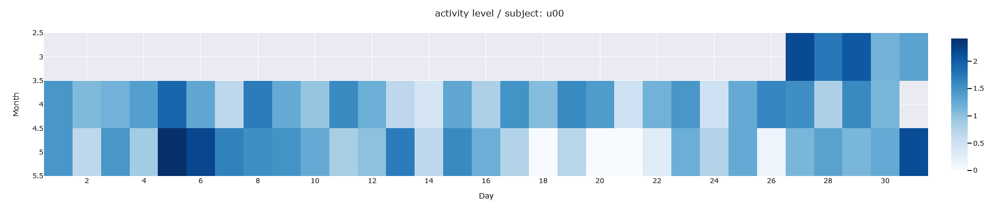

In [40]:
user_list = ['u00']
columns = ['activity']
title = "activity level / subject: {}".format(user_list[0])
resample = "D"

fig = EDA_punchcard.punchcard_plot(sf,user_list,columns,title, resample)
fig.show()

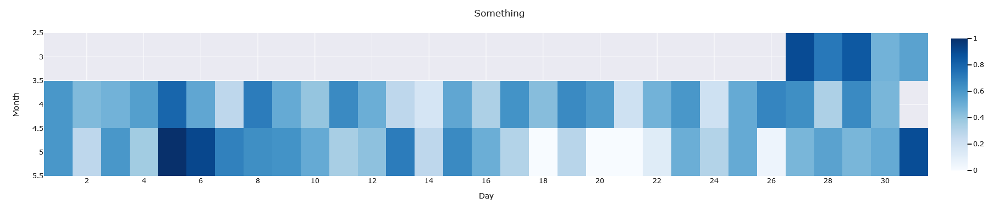

In [41]:
user_list = ['u00']
columns = ['activity']
title = "Something"
resample = 'D'
normalize = True

fig = EDA_punchcard.punchcard_plot(sf,user_list,columns,title,resample,normalize)
fig.show()

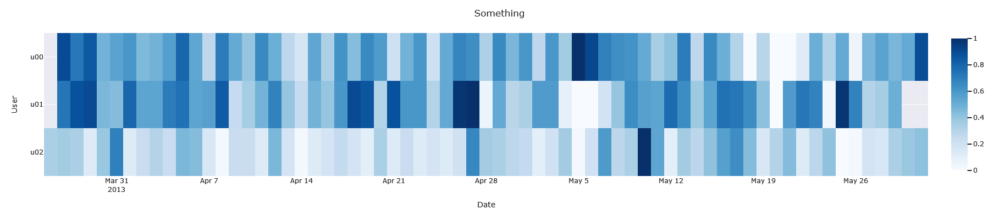

In [42]:
user_list = ['u00','u01','u02']
columns = ['activity']
title = "Something"
resample = 'D'
normalize = True

fig = EDA_punchcard.punchcard_plot(sf,user_list,columns,title,resample,normalize)
fig.show()